# data research

Тут больше про исследование данных

In [1]:
import pandas as pd
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import re
from tqdm.notebook import tqdm

from sklearn.metrics.pairwise import cosine_similarity

import glob

from dotenv import load_dotenv
import os

import seaborn as sns
import numpy as np

In [2]:
load_dotenv()

PATH_DATA = os.getenv("PATH_DATA")

globPaths = glob.glob(f'{PATH_DATA}/data.csv', )
if len(globPaths) > 1:
    raise ValueError('Датасетов больше')

In [3]:
data = pd.read_csv(globPaths[0])
print(data.shape)
data.head()

(3128112, 9)


,Unnamed: 0,id_sol,title_sol,commentCount,topLevelCommentCount,viewCount,solutionTags,post_id,post_content
0,0,3619262.0,✅3 Method's || C++ || JAVA || PYTHON || Beginn...,22.0,12.0,64593.0,"['C++', 'Java', 'Python3', 'Array', 'Hash Table']",5545248.0,# Intuition\n<!-- Describe your first thoughts...
1,1,2990807.0,Solution - C++/Java/Python (Both Brute force...,111.0,67.0,314689.0,"['C++', 'Java', 'Python', 'Hash Table', 'Two P...",4733461.0,# Beginner doubt - Where is main function?\n- ...
2,2,3675059.0,(VIDEO) Step-by-Step Visualization Using a Has...,0.0,0.0,660.0,"['Python', 'Python3', 'Array', 'Hash Table']",5619788.0,https://www.youtube.com/watch?v=luicuNOBTAI\n\...
3,3,3662568.0,Python🔥Java🔥 C++🔥Simple Solution🔥Video Solution,0.0,0.0,6176.0,"['C++', 'Java', 'Python3', 'Hash Table']",5603349.0,# Please UPVOTE \uD83D\uDC4D\n# !! BIG ANNOUNC...
4,4,3543160.0,Python🔥Java🔥 C++🔥|| Simple Solution,15.0,12.0,81617.0,"['C++', 'Java', 'Python3', 'Array', 'Hash Table']",5445878.0,# Please UPVOTE \uD83D\uDC4D\n\n# **!! BIG ANN...


# sample

In [4]:
data = data.sample(frac=0.05, random_state=42)
print(data.shape)
print(data.post_content.iloc[0])

(156406, 9)
The answer is below: \n\n        int num = 0, len = digits.size();\n        vector<int>vec;\n        bool plusOne = true;\n    \n        for(int i =  len - 1; i >= 0; i--){\n            num = digits[i];\n            if(plusOne){\n                if(digits[i] + 1 == 10){\n                \tif(i == 0){\n                \t\tvec.push_back(0);\n                \t\tvec.push_back(1);\n                \t\tbreak;\n                \t}else{\n                    num = 0;\n                \t}\n                }else{\n                    plusOne = false;\n                    num += 1;\n                }\n            }\n            vec.push_back(num);\n        }\n        \n        \n        std::reverse(vec.begin(), vec.end());\n        \n        return vec;\n    }\n};


In [15]:
data.dropna(subset=['post_content'], inplace=True)
data.drop_duplicates(subset=['id_sol'], inplace=True)
data = data.assign(len_post_content=data.post_content.map(len))

In [16]:
data.shape

(156403, 10)

Сравнить частотность языковых конструкций/библиотек/методов с продакшен кодом (опенсорс с гитхаба, только фильтры настроить). Написать продактам разработки языков, где известна команда, что им было бы интересно узнать. Оценить долю type 1, 2, 3 и 4 code clones, вариативность решений в зависимости от задачи.

# Тестирую функцию для поиска решения

In [8]:
reg_pattern = r'\`\`\`.+? \[\]\\n.+?\`\`\`\\n'
reg_pattern_code = r'\`\`\`.+\`\`\`'

In [9]:
code_data = pd.DataFrame(columns=['code'])
for i in tqdm(range(data.shape[0])):
    post_content = data.iloc[i, data.columns.get_loc('post_content')]
    if (not post_content) or (post_content is None) or (post_content is np.nan):
        continue
    find_code = re.findall(string=post_content, pattern=reg_pattern)
    if find_code:
        code_data = pd.concat(
            [code_data, pd.DataFrame(find_code, columns=['code'])])
        continue
    find_code = re.findall(
        string=post_content, pattern=reg_pattern_code)
    if find_code:
        code_data = pd.concat(
            [code_data, pd.DataFrame(find_code, columns=['code'])])
        continue
    code_data = pd.concat(
        [code_data, pd.DataFrame([post_content], columns=['code'])])

  0%|          | 0/156406 [00:00<?, ?it/s]

## Test для извлечения названий библиотек

In [12]:
text_test = data.iloc[1].post_content
print(text_test)

```\nclass Solution(object):\n    def letterCombinations(self, digits):\n        """\n        :type digits: str\n        :rtype: List[str]\n        """\n        if(len(digits)==0):\n            return []\n        myLetters = [[\' \'],[\'\'],[\'a\',\'b\',\'c\'],\n                     [\'d\',\'e\',\'f\'],[\'g\',\'h\',\'i\'],[\'j\',\'k\',\'l\'],\n                     [\'m\',\'n\',\'o\'],[\'p\',\'q\',\'r\',\'s\'],[\'t\',\'u\',\'v\'],\n                    [\'w\',\'x\',\'y\',\'z\']]\n        n = len(digits)\n        if(n==1):\n            return myLetters[int(digits)]\n        else:\n            return [y+x for y in self.letterCombinations(digits[0]) for x in self.letterCombinations(digits[1:])]\n


In [13]:
pattern = r'(\#|)import\s(?P<import>[a-z0-9]+?(\s|\.[a-z]+))'
re.findall(pattern=pattern, string=text_test)

[]

In [17]:
def clean_code(text: str):
    text = text.lower()
    text = re.sub(pattern=r'\`\`\`.+? \[\]', string=text, repl='')
    text = re.sub(pattern=r'\\n', string=text, repl=r' ')
    # text = re.sub(pattern=r'\s+', string=text, repl=' ')
    text = re.sub(pattern=r'\`', string=text, repl='')
    text = re.sub(pattern=r'\\n', string=text, repl=r' ')
    text = re.sub(r'\W', lambda match: ' ' + match.group(0) + ' ', text)
    text = re.sub(r'\w+', lambda match: ' ' + match.group(0) + ' ', text)  
    text = re.sub(pattern='\s+', repl=' ', string=text)
    return text

data = data.assign(clen_code=data.post_content.map(clean_code))

In [18]:
def find_import_in_code(text):
    pattern = r'(\#|)import\s(?P<import>[a-z0-9]+?(\s|\.[a-z]+))'
    res = re.search(pattern=pattern, string=text)
    if res:
        return res.group('import')
    return None

    
data = data.assign(imports=data.post_content.map(find_import_in_code))

In [19]:
imports = [i for i in data[data.imports.notna()].imports if i not in ['java.util']]

In [20]:
pd.value_counts(imports)

numpy               66
scala.collection    61
java.math           49
java.lang           21
heapq               16
                    ..
scipy.special        1
sys                  1
queue                1
any                  1
revision             1
Length: 63, dtype: int64

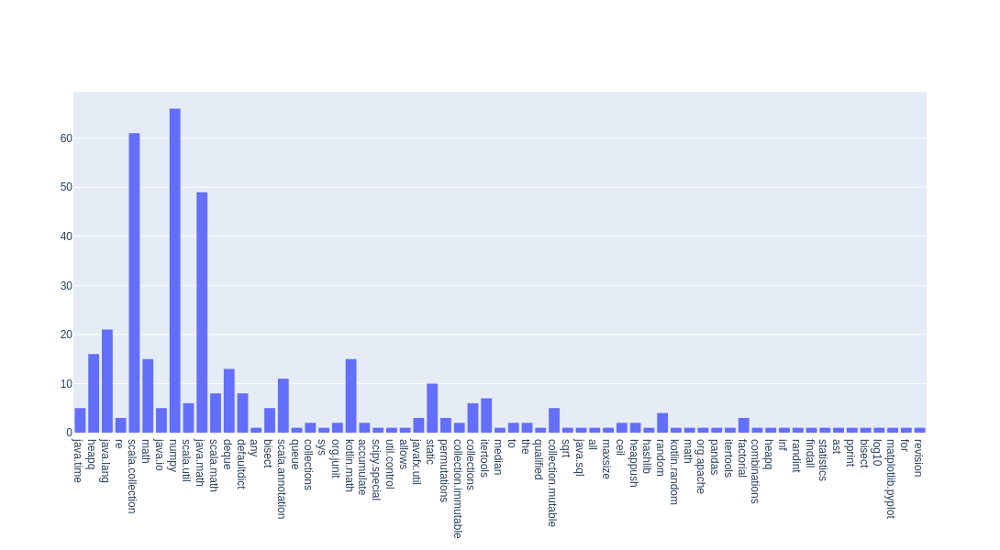

In [21]:
import plotly
from plotly import graph_objects as go

fig = go.Figure()
hist_plotly = go.Histogram(x=imports)
fig.add_trace(hist_plotly)
fig.update_layout(width=800, height=600)

# Какая разница между решениями и наличием импорта библиотек

In [22]:
data = data.assign(flag=data.imports.map(lambda x: 1 if x else 0))

In [23]:
data[data.imports.notna()].shape

(810, 13)

In [24]:
data.flag.value_counts()

0    155593
1       810
Name: flag, dtype: int64

In [25]:
data = data.assign(len_code=data.clen_code.map(len))

In [26]:
data[data.flag == 1].len_code.mean()

1226.025925925926

In [27]:
data[data.flag == 0].len_code.mean()

816.6132987987892

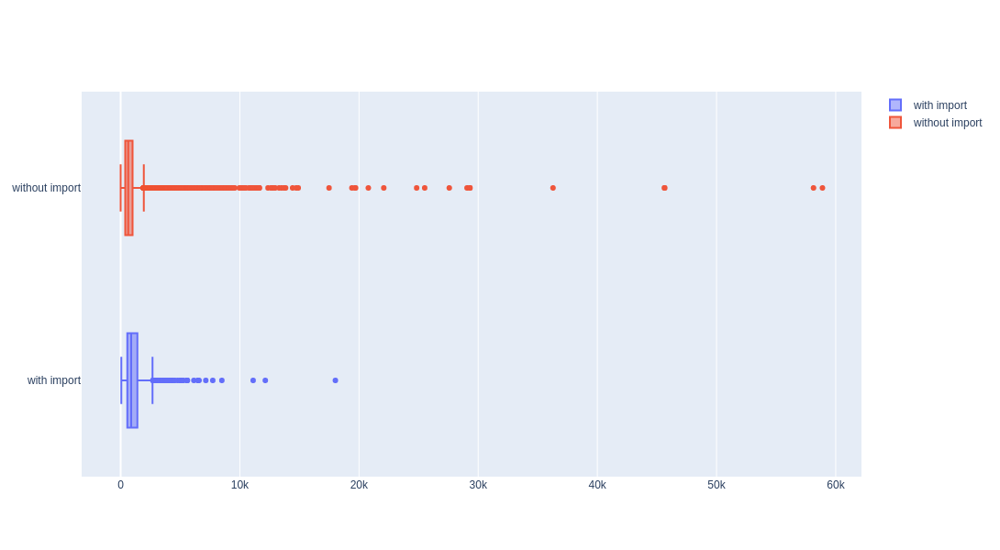

In [28]:
box_code_with_import = go.Box(x=data[data.flag == 1].len_code, name='with import')
box_code_withNot_import = go.Box(x=data[data.flag == 0].len_code, name='without import')

fig = go.Figure(data=[box_code_with_import, box_code_withNot_import])
fig.update_layout(width=800, height=600)

Кумулятивные графики: Постройте кумулятивные графики для каждого объекта, показывая, как накапливается количество значений по мере увеличения значения. Это может помочь визуально сравнить распределения и определить различия в их форме и поведении.

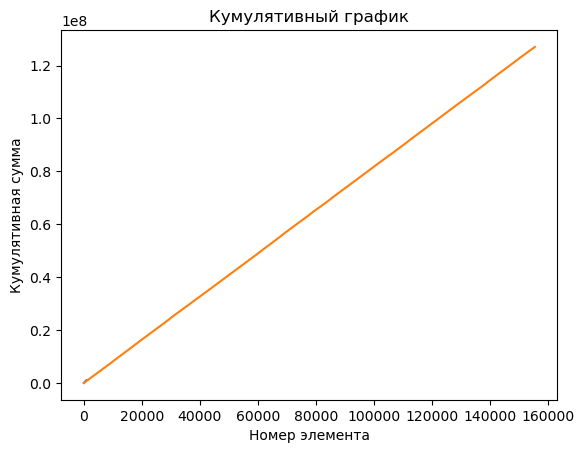

In [29]:
import numpy as np
import matplotlib.pyplot as plt

cumulative_data1 = np.cumsum((data[data.flag == 1].len_code.values))
cumulative_data0 = np.cumsum((data[data.flag == 0].len_code.values))
plt.plot(cumulative_data1)
plt.plot(cumulative_data0)

plt.xlabel('Номер элемента')
plt.ylabel('Кумулятивная сумма')
plt.title('Кумулятивный график')
plt.show()

Интервальные оценки: Если у вас есть достаточно данных, вы можете построить доверительные интервалы для различных статистических показателей каждого объекта. Затем сравните эти интервалы, чтобы определить, перекрываются ли они или нет. Если интервалы не перекрываются, это может указывать на значимые различия между распределениями.
покажи пример 

Доверительный интервал для объекта 1: (1135.3319854712595, 1316.7198663805925)
Доверительный интервал для объекта 2: (812.7996138424087, 820.4269837551697)
Доверительные интервалы не перекрываются. Имеются значимые различия.


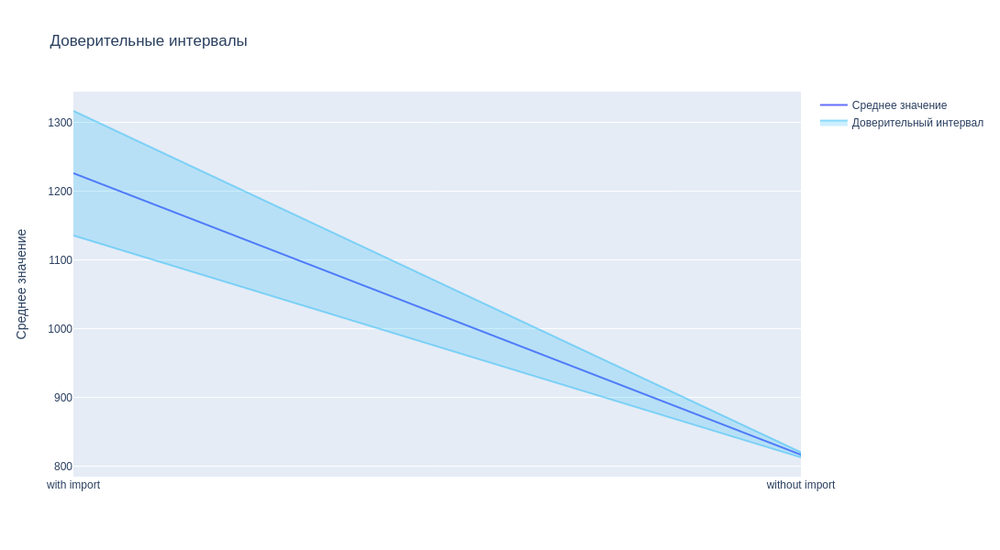

In [30]:
import numpy as np
from scipy import stats

mean1, std1 = np.mean(data[data.flag == 1].len_code.values), np.std(data[data.flag == 1].len_code.values)
mean2, std2 = np.mean(data[data.flag == 0].len_code.values), np.std(data[data.flag == 0].len_code.values)

ci1 = stats.norm.interval(0.95, loc=mean1, scale=std1/np.sqrt(len(data[data.flag == 1].len_code.values)))
ci2 = stats.norm.interval(0.95, loc=mean2, scale=std2/np.sqrt(len(data[data.flag == 0].len_code.values)))

print(f"Доверительный интервал для объекта 1: {ci1}")
print(f"Доверительный интервал для объекта 2: {ci2}")

if ci1[1] < ci2[0] or ci1[0] > ci2[1]:
    print("Доверительные интервалы не перекрываются. Имеются значимые различия.")
else:
    print("Доверительные интервалы перекрываются. Различия не являются значимыми.")

x = ['with import', 'without import']
y = [mean1, mean2]
y_lower = [ci1[0], ci2[0]]
y_upper = [ci1[1], ci2[1]]
fig = go.Figure()

fig.add_trace(go.Scatter(x=x, y=y, mode='lines', name='Среднее значение'))

fig.add_trace(go.Scatter(
    x=x + x[::-1],
    y=y_upper + y_lower[::-1],
    mode='lines',
    fill='toself',
    fillcolor='rgba(0, 176, 246, 0.2)',
    line=dict(color='rgba(0, 176, 246, 0.4)'),
    name='Доверительный интервал'
))

fig.update_layout(
    title='Доверительные интервалы',
    yaxis=dict(title='Среднее значение'),
    showlegend=True
)

fig.update_layout(width=800, height=600)

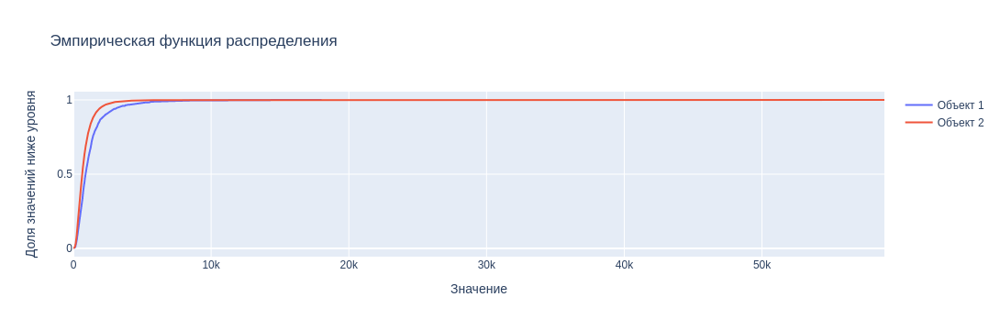

In [31]:
import plotly.graph_objects as go
import numpy as np

# Сгенерировать данные для двух объектов
data1 = data[data.flag == 1].len_code.values
data2 = data[data.flag == 0].len_code.values

# Вычислить ECDF для каждого объекта
x1 = np.sort(data1)
y1 = np.arange(1, len(data1) + 1) / len(data1)

x2 = np.sort(data2)
y2 = np.arange(1, len(data2) + 1) / len(data2)

# Создать график ECDF
fig = go.Figure()

# Добавить ECDF для объекта 1
fig.add_trace(go.Scatter(x=x1, y=y1, mode='lines', name='Объект 1'))

# Добавить ECDF для объекта 2
fig.add_trace(go.Scatter(x=x2, y=y2, mode='lines', name='Объект 2'))

fig.update_layout(
    title='Эмпирическая функция распределения',
    xaxis=dict(title='Значение'),
    yaxis=dict(title='Доля значений ниже уровня'),
    showlegend=True
)

fig.show()